In [1]:
import sys
import stlearn as st
st.settings.set_figure_params(dpi=300)
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import sys
file = Path("../stimage").resolve()
parent= file.parent
sys.path.append(str(parent))
from PIL import Image
from stimage.utils import gene_plot, Read10X, ReadOldST
from stimage.model import CNN_NB_trainable
from stimage.data_generator import DataGenerator
import tensorflow as tf
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
import numpy as np

In [2]:
BASE_PATH = Path("/scratch/imb/Xiao/unet")
TILE_PATH = Path("/tmp") / "tiles"
TILE_PATH.mkdir(parents=True, exist_ok=True)

In [3]:
SAMPLE = "Sample1"
Sample1 = ReadOldST(count_matrix_file=BASE_PATH / ("count_data/JVQN_Brain_"+SAMPLE[-1]+"_S"+SAMPLE[-1]+"_stdata.tsv"),
                    spatial_file=BASE_PATH / ("spot_info/spot_data-selection-CY3_"+SAMPLE+"_all.tsv"),
                    image_file=BASE_PATH / ("images/HE_"+SAMPLE+".jpg"),
                    library_id=SAMPLE)
Sample1_features = pd.read_csv(BASE_PATH / ("features/train/"+SAMPLE+".csv"), index_col=0)
Sample1.obs["f_index"] = Sample1.obs["imagerow"].astype(str) + "-" + Sample1.obs["imagecol"].astype(str)
Sample1_features = Sample1_features.reindex(Sample1.obs["f_index"])
Sample1_features.index = Sample1.obs_names
Sample1.obsm["features"] = Sample1_features

Added tissue image to the object!


In [4]:
SAMPLE = "Sample2"
Sample2 = ReadOldST(count_matrix_file=BASE_PATH / ("count_data/JVQN_Brain_"+SAMPLE[-1]+"_S"+SAMPLE[-1]+"_stdata.tsv"),
                    spatial_file=BASE_PATH / ("spot_info/spot_data-selection-CY3_"+SAMPLE+"_all.tsv"),
                    image_file=BASE_PATH / ("images/HE_"+SAMPLE+".jpg"),
                    library_id=SAMPLE)
Sample2_features = pd.read_csv(BASE_PATH / ("features/train/"+SAMPLE+".csv"), index_col=0)
Sample2.obs["f_index"] = Sample2.obs["imagerow"].astype(str) + "-" + Sample2.obs["imagecol"].astype(str)
Sample2_features = Sample2_features.reindex(Sample2.obs["f_index"])
Sample2_features.index = Sample2.obs_names
Sample2.obsm["features"] = Sample2_features

Added tissue image to the object!


In [5]:
SAMPLE = "Sample3"
Sample3 = ReadOldST(count_matrix_file=BASE_PATH / ("count_data/JVQN_Brain_"+SAMPLE[-1]+"_S"+SAMPLE[-1]+"_stdata.tsv"),
                    spatial_file=BASE_PATH / ("spot_info/spot_data-selection-CY3_"+SAMPLE+"_all.tsv"),
                    image_file=BASE_PATH / ("images/HE_"+SAMPLE+".jpg"),
                    library_id=SAMPLE)
Sample3_features = pd.read_csv(BASE_PATH / ("features/train/"+SAMPLE+".csv"), index_col=0)
Sample3.obs["f_index"] = Sample3.obs["imagerow"].astype(str) + "-" + Sample3.obs["imagecol"].astype(str)
Sample3_features = Sample3_features.reindex(Sample3.obs["f_index"])
Sample3_features.index = Sample3.obs_names
Sample3.obsm["features"] = Sample3_features

Added tissue image to the object!


In [6]:
SAMPLE = "Sample4"
Sample4 = ReadOldST(count_matrix_file=BASE_PATH / ("count_data/JVQN_Brain_"+SAMPLE[-1]+"_S"+SAMPLE[-1]+"_stdata.tsv"),
                    spatial_file=BASE_PATH / ("spot_info/spot_data-selection-CY3_"+SAMPLE+"_all.tsv"),
                    image_file=BASE_PATH / ("images/HE_"+SAMPLE+".jpg"),
                    library_id=SAMPLE)
Sample4_features = pd.read_csv(BASE_PATH / ("features/valid/"+SAMPLE+".csv"), index_col=0)
Sample4.obs["f_index"] = Sample4.obs["imagerow"].astype(str) + "-" + Sample4.obs["imagecol"].astype(str)
Sample4_features = Sample4_features.reindex(Sample4.obs["f_index"])
Sample4_features.index = Sample4.obs_names
Sample4.obsm["features"] = Sample4_features

Added tissue image to the object!


In [7]:
SAMPLE = "Sample5"
Sample5 = ReadOldST(count_matrix_file=BASE_PATH / ("count_data/JVQN_Brain_"+SAMPLE[-1]+"_S"+SAMPLE[-1]+"_stdata.tsv"),
                    spatial_file=BASE_PATH / ("spot_info/spot_data-selection-CY3_"+SAMPLE+"_all.tsv"),
                    image_file=BASE_PATH / ("images/HE_"+SAMPLE+".jpg"),
                    library_id=SAMPLE)
Sample5_features = pd.read_csv(BASE_PATH / ("features/test/"+SAMPLE+".csv"), index_col=0)
Sample5.obs["f_index"] = Sample5.obs["imagerow"].astype(str) + "-" + Sample5.obs["imagecol"].astype(str)
Sample5_features = Sample5_features.reindex(Sample5.obs["f_index"])
Sample5_features.index = Sample5.obs_names
Sample5.obsm["features"] = Sample5_features

Added tissue image to the object!


In [8]:
SAMPLE = "Sample6"
Sample6 = ReadOldST(count_matrix_file=BASE_PATH / ("count_data/JVQN_Brain_"+SAMPLE[-1]+"_S"+SAMPLE[-1]+"_stdata.tsv"),
                    spatial_file=BASE_PATH / ("spot_info/spot_data-selection-CY3_"+SAMPLE+"_all.tsv"),
                    image_file=BASE_PATH / ("images/HE_"+SAMPLE+".jpg"),
                    library_id=SAMPLE)
Sample6_features = pd.read_csv(BASE_PATH / ("features/test/"+SAMPLE+".csv"), index_col=0)
Sample6.obs["f_index"] = Sample6.obs["imagerow"].astype(str) + "-" + Sample6.obs["imagecol"].astype(str)
Sample6_features = Sample6_features.reindex(Sample6.obs["f_index"])
Sample6_features.index = Sample6.obs_names
Sample6.obsm["features"] = Sample6_features

Added tissue image to the object!


In [9]:
# Plp1 Aqp4 ERMN Apold1 Ccl4 Reln Pdgfra Dsp
gene_list=["ENSMUSG00000031425", "ENSMUSG00000024411", "ENSMUSG00000026830", 
           "ENSMUSG00000090698", "ENSMUSG00000018930", "ENSMUSG00000042453",
           "ENSMUSG00000029231", "ENSMUSG00000054889"]
gene = gene_list[0]

In [10]:
for adata in [
    Sample1,
    Sample2,
    Sample3,
    Sample4,
    Sample5,
    Sample6,
]:
#     count_df = adata.to_df()
#     count_df[count_df <=1] = 0
#     count_df[count_df >1] = 1
#     adata.X = count_df
#     adata[:,gene_list]
#     st.pp.filter_genes(adata,min_cells=1)
#     st.pp.normalize_total(adata)
#     st.pp.log1p(adata)
#     st.pp.scale(adata)

    # pre-processing for spot image
    TILE_PATH_ = TILE_PATH / list(adata.uns["spatial"].keys())[0]
    TILE_PATH_.mkdir(parents=True, exist_ok=True)
    st.pp.tiling(adata, TILE_PATH_, crop_size=40)
    
    

Tiling image: 100%|██████████ [ time left: 00:00 ]
Tiling image: 100%|██████████ [ time left: 00:00 ]
Tiling image: 100%|██████████ [ time left: 00:00 ]
Tiling image: 100%|██████████ [ time left: 00:00 ]
Tiling image: 100%|██████████ [ time left: 00:00 ]
Tiling image: 100%|██████████ [ time left: 00:00 ]


In [11]:
training_dataset = Sample1.concatenate(
    [Sample2, Sample3],
    batch_key="library_id",
    uns_merge="unique",
    batch_categories=[
        k
        for d in [
            Sample1.uns["spatial"],
            Sample2.uns["spatial"],
            Sample3.uns["spatial"],
        ]
        for k in [list(d.keys())[0]]
    ],
)

In [12]:
valid_dataset = Sample4.copy()

In [13]:
test_dataset = Sample5.concatenate(
    [Sample6],
    batch_key="library_id",
    uns_merge="unique",
    batch_categories=[
        k
        for d in [
            Sample5.uns["spatial"],
            Sample6.uns["spatial"],
        ]
        for k in [list(d.keys())[0]]
    ],
)

In [14]:
train_gen = tf.data.Dataset.from_generator(
            lambda:DataGenerator(adata=training_dataset, 
                          genes=[gene], aug=True),
            output_types=(tf.float32, tf.float32), 
            output_shapes=([299,299,3], [1])
)
train_gen_ = train_gen.shuffle(buffer_size=500).batch(128).repeat(3).cache().prefetch(tf.data.experimental.AUTOTUNE)
valid_gen = tf.data.Dataset.from_generator(
            lambda:DataGenerator(adata=valid_dataset, 
                          genes=[gene]), 
            output_types=(tf.float32, tf.float32), 
            output_shapes=([299,299,3], [1])
)
valid_gen_ = valid_gen.shuffle(buffer_size=500).batch(128).repeat(3).cache().prefetch(tf.data.experimental.AUTOTUNE)
test_gen = tf.data.Dataset.from_generator(
            lambda:DataGenerator(adata=test_dataset, 
                          genes=[gene]), 
            output_types=(tf.float32, tf.float32), 
            output_shapes=([299,299,3], [1])
)
test_gen_ = test_gen.batch(1)

In [15]:
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input as preprocess_vgg16
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input as preprocess_resnet50
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Input, concatenate, Dropout, Lambda, Concatenate
from tensorflow.keras.models import Model
import tensorflow_probability as tfp
tf.compat.v1.enable_eager_execution()
tfd = tfp.distributions
tfb = tfp.bijectors
import six
from tensorflow.python.keras import backend as K
from tensorflow.python.keras.utils.tf_utils import is_tensor_or_variable

def ZINB_layer(out): 
    n = tf.squeeze(tf.math.softplus(out[:,0:1]))

    p = tf.squeeze(tf.math.sigmoid(out[:,1:2]))

    s = tf.math.sigmoid(out[:,2:3])

    probs = tf.concat([1-s, s], axis=1)
    
    mix = tfd.Mixture(
          cat=tfd.Categorical(probs=probs),
          components=[
          tfd.Deterministic(loc=tf.zeros_like(n)),
          tfd.NegativeBinomial(total_count=n, probs=p),
        ])
    return mix


class MeanMetricWrapper(tf.keras.metrics.Mean):
    def __init__(self, fn, name=None, dtype=None, **kwargs):
        super(MeanMetricWrapper, self).__init__(name=name, dtype=dtype)
        self._fn = fn
        self._fn_kwargs = kwargs
    def update_state(self, y_true, y_pred, sample_weight=None):
        matches = self._fn(y_true, y_pred, **self._fn_kwargs)
        return super(MeanMetricWrapper, self).update_state(
                     matches, sample_weight=sample_weight)
    def get_config(self):
        config = {}
        for k, v in six.iteritems(self._fn_kwargs):
            config[k] = K.eval(v) if is_tensor_or_variable(v) else v
        base_config = super(MeanMetricWrapper, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))


def one_gene_block(inputs, name):
#     inputs = Dense(256, activation='relu', activity_regularizer=tf.keras.regularizers.l2(0.01))(inputs)
    outputs = Dense(3)(inputs)
    p_y_zinb = tfp.layers.DistributionLambda(ZINB_layer, name=name)(outputs)
    return p_y_zinb



def resnet_ZINB(tile_shape):
    tile_input = Input(shape=tile_shape, name = "tile_input")
    resnet_base = ResNet50(input_tensor=tile_input, weights='imagenet', include_top=False)
#     stage_5_start = resnet_base.get_layer("conv5_block1_1_conv")
#     for i in range(resnet_base.layers.index(stage_5_start)):
#         resnet_base.layers[i].trainable = False
    
    for i in resnet_base.layers:
        i.trainable = False
    cnn = resnet_base.output
    cnn = GlobalAveragePooling2D()(cnn)
#     cnn = Dropout(0.5)(cnn)
#     cnn = Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l1(0.01),
#                 activity_regularizer=tf.keras.regularizers.l2(0.01))(cnn)
    # cnn = Dense(256, activation='relu')(cnn)
    output_layers = []
    for i in range(1):
        output_layers.append(one_gene_block(cnn, name="gene_{}".format(i)))

    
    
    model = Model(inputs=tile_input, outputs=output_layers)
    losses={}
    for i in range(1):
        losses["gene_{}".format(i)] = lambda x,y : -y.log_prob(tf.reshape(x[:,i],(-1,)))
#     optimizer = tf.keras.optimizers.RMSprop(0.001)
    optimizer = tf.keras.optimizers.Adam(0.0001)
    model.compile(loss=losses,
                  optimizer=optimizer)    
    return model

In [24]:
def negative_binomial_layer(x):
    """
    Lambda function for generating negative binomial parameters
    n and p from a Dense(2) output.
    Assumes tensorflow 2 backend.

    Usage
    -----
    outputs = Dense(2)(final_layer)
    distribution_outputs = Lambda(negative_binomial_layer)(outputs)

    Parameters
    ----------
    x : tf.Tensor
        output tensor of Dense layer

    Returns
    -------
    out_tensor : tf.Tensor

    """

    # Get the number of dimensions of the input
    num_dims = len(x.get_shape())

    # Separate the parameters
    n, p = tf.unstack(x, num=2, axis=-1)

    # Add one dimension to make the right shape
    n = tf.expand_dims(n, -1)
    p = tf.expand_dims(p, -1)

    # Apply a softplus to make positive
    n = tf.keras.activations.softplus(n)

    # Apply a sigmoid activation to bound between 0 and 1
    p = tf.keras.activations.sigmoid(p)

    # Join back together again
    out_tensor = tf.concat((n, p), axis=num_dims - 1)

    return out_tensor

def multiple_gene_nb_loss(genes):
    def negative_binomial_loss(y_true, y_pred):
        """
        Negative binomial loss function.
        Assumes tensorflow backend.
    
        Parameters
        ----------
        y_true : tf.Tensor
            Ground truth values of predicted variable.
        y_pred : tf.Tensor
            n and p values of predicted distribution.

        Returns
        -------
        nll : tf.Tensor
            Negative log likelihood.
        """

        # Separate the parameters
        n, p = tf.unstack(y_pred, num=2, axis=-1)

        # Add one dimension to make the right shape
        n = tf.expand_dims(n, -1)
        p = tf.expand_dims(p, -1)

        # Calculate the negative log likelihood
        nll = (
            tf.math.lgamma(n)
            + tf.math.lgamma(y_true[:,genes] + 1)
            - tf.math.lgamma(n + y_true[:,genes])
            - n * tf.math.log(p)
            - y_true[:,genes] * tf.math.log(1 - p)
        )

        return nll
    return negative_binomial_loss


def resnet_NB(tile_shape):
    tile_input = Input(shape=tile_shape, name = "tile_input")
    resnet_base = ResNet50(input_tensor=tile_input, weights='imagenet', include_top=False)
#     stage_5_start = resnet_base.get_layer("conv5_block1_1_conv")
#     for i in range(resnet_base.layers.index(stage_5_start)):
#         resnet_base.layers[i].trainable = False
    
    for i in resnet_base.layers:
        i.trainable = False
    cnn = resnet_base.output
    cnn = GlobalAveragePooling2D()(cnn)
    cnn = Dropout(0.5)(cnn)
#     cnn = Dropout(0.5)(cnn)
#     cnn = Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l1(0.01),
#                 activity_regularizer=tf.keras.regularizers.l2(0.01))(cnn)
    # cnn = Dense(256, activation='relu')(cnn)
    output_layers = []
    for i in range(1):
        output = Dense(2)(cnn)
        output_layers.append(Lambda(negative_binomial_layer, name="gene_{}".format(i))(output))
    
    model = Model(inputs=tile_input, outputs=output_layers)
    losses={}
    for i in range(1):
        losses["gene_{}".format(i)] = multiple_gene_nb_loss(i)
#     optimizer = tf.keras.optimizers.RMSprop(0.001)
    optimizer = tf.keras.optimizers.Adam(0.001)
    model.compile(loss=losses,
                  optimizer=optimizer)    
    return model

In [25]:
tf.keras.backend.clear_session()
# model = vgg16_ZINB((299, 299, 3))
# model = resnet_ZINB((299, 299, 3))
model = resnet_NB((299, 299, 3))
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10,
                                            restore_best_weights=True)

In [18]:
print(model.summary())

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
tile_input (InputLayer)         [(None, 299, 299, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 305, 305, 3)  0           tile_input[0][0]                 
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 150, 150, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 150, 150, 64) 256         conv1_conv[0][0]                 
______________________________________________________________________________________________

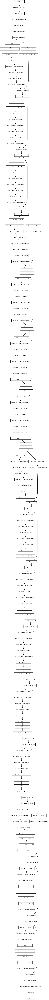

In [19]:
tf.keras.utils.plot_model(model,"./model.png")

In [27]:
train_history = model.fit(train_gen_,
                          epochs=10,
                          validation_data=valid_gen_,
                          callbacks=[callback],# PrinterCallback()
                          #verbose=0
                          )

Epoch 1/10
48/48 [==============================] - 14s 291ms/step - loss: 4.0152 - val_loss: 3.4244
Epoch 2/10
48/48 [==============================] - 14s 290ms/step - loss: 3.9954 - val_loss: 3.4295
Epoch 3/10
48/48 [==============================] - 14s 290ms/step - loss: 3.9771 - val_loss: 3.4146
Epoch 4/10
48/48 [==============================] - 14s 291ms/step - loss: 3.9593 - val_loss: 3.4422
Epoch 5/10
48/48 [==============================] - 14s 291ms/step - loss: 3.9403 - val_loss: 3.4151
Epoch 6/10
48/48 [==============================] - 14s 291ms/step - loss: 3.9324 - val_loss: 3.4612
Epoch 7/10
48/48 [==============================] - 14s 289ms/step - loss: 3.9192 - val_loss: 3.4629
Epoch 8/10
48/48 [==============================] - 14s 291ms/step - loss: 3.9094 - val_loss: 3.4305
Epoch 9/10
48/48 [==============================] - 14s 290ms/step - loss: 3.9079 - val_loss: 3.4475
Epoch 10/10
48/48 [==============================] - 14s 291ms/step - loss: 3.8951 - val_lo

In [28]:
test_predictions = model.predict(test_gen_)
from scipy.stats import nbinom

n = test_predictions[:,0]; p = test_predictions[:,1]
y_pred = nbinom.mean(n,p)


test_dataset.obsm["predicted_gene"] = y_pred

/scratch/imb/Xiao/.conda/envs/stimage/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/scratch/imb/Xiao/STimage/stimage/utils.py:113: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cb = plt.colorbar(plot, cax=fig.add_axes(



ENSMUSG00000031425:


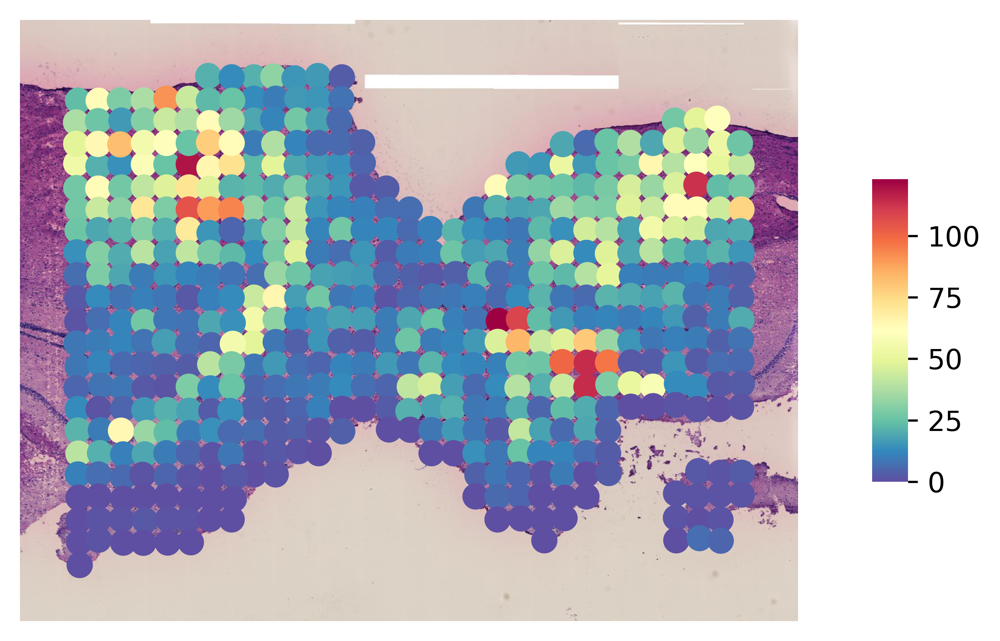

<Figure size 1800x1200 with 0 Axes>


ENSMUSG00000031425:


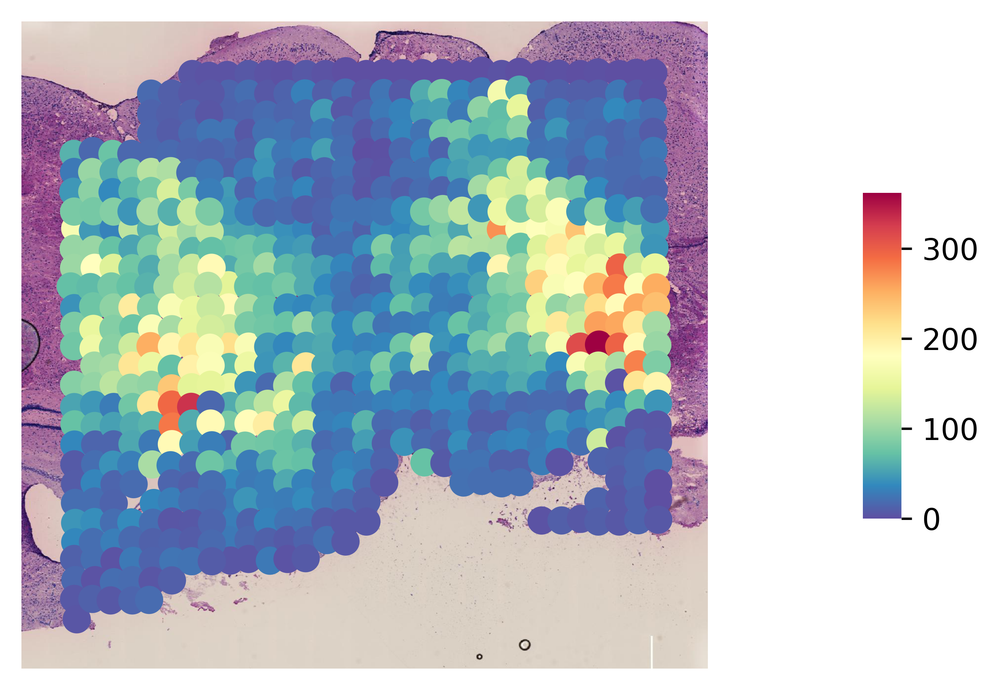

<Figure size 1800x1200 with 0 Axes>


ENSMUSG00000031425:


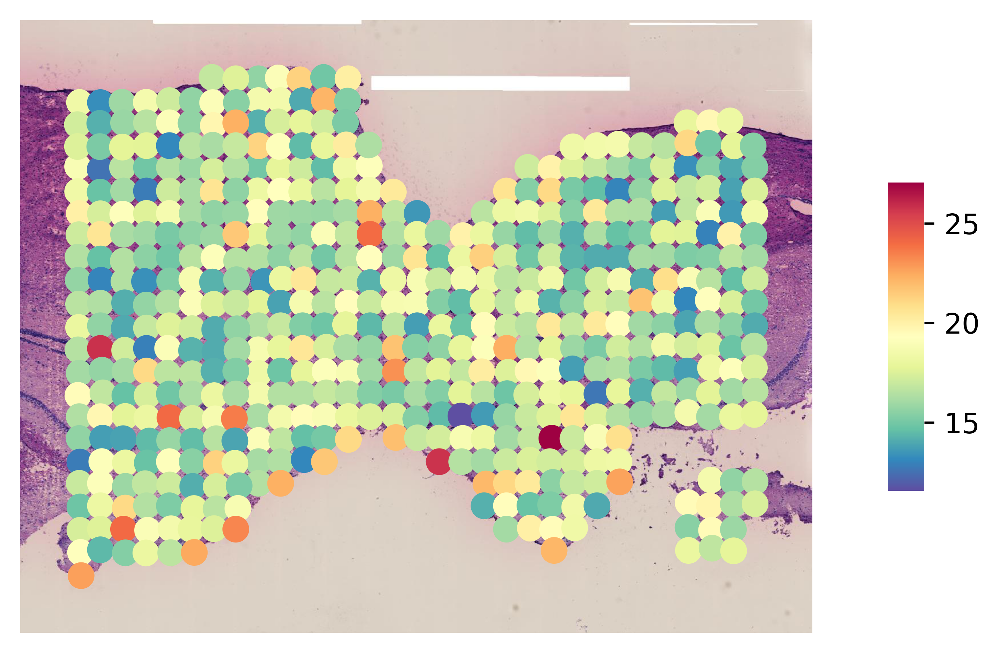

<Figure size 1800x1200 with 0 Axes>


ENSMUSG00000031425:


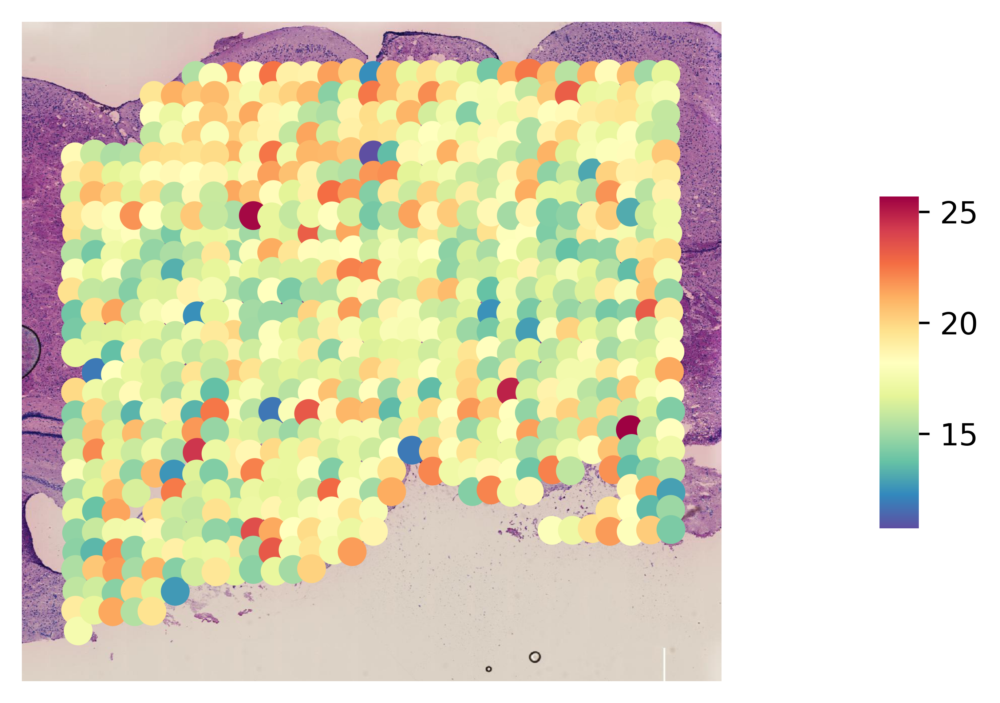

<Figure size 1800x1200 with 0 Axes>

Log transformation step is finished in adata.X
Log transformation step is finished in adata.X

ENSMUSG00000031425:


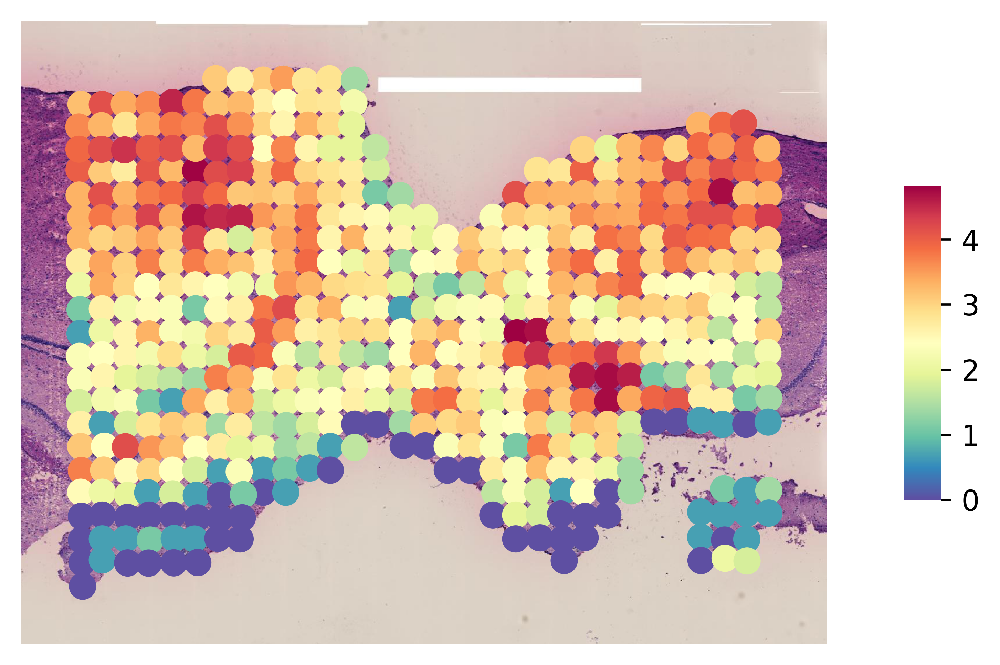

<Figure size 1800x1200 with 0 Axes>


ENSMUSG00000031425:


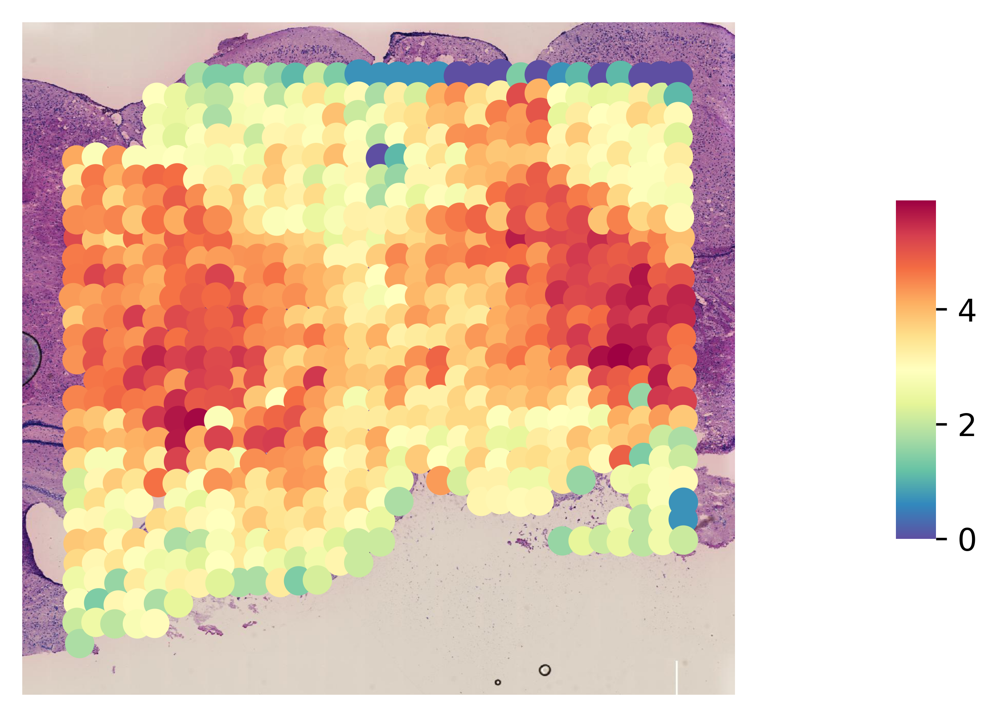

<Figure size 1800x1200 with 0 Axes>


ENSMUSG00000031425:


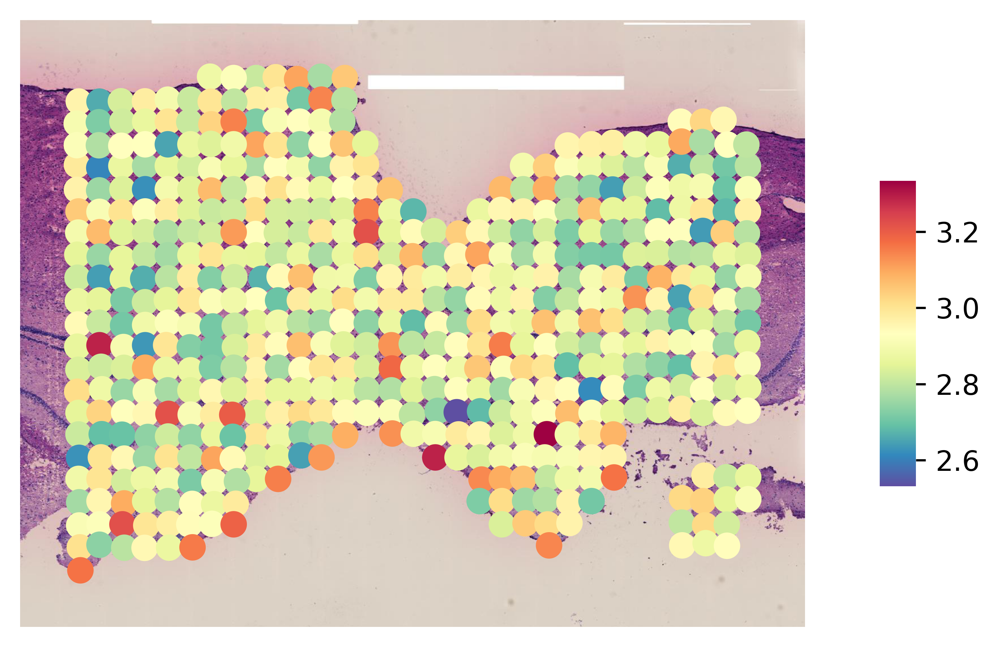

<Figure size 1800x1200 with 0 Axes>


ENSMUSG00000031425:


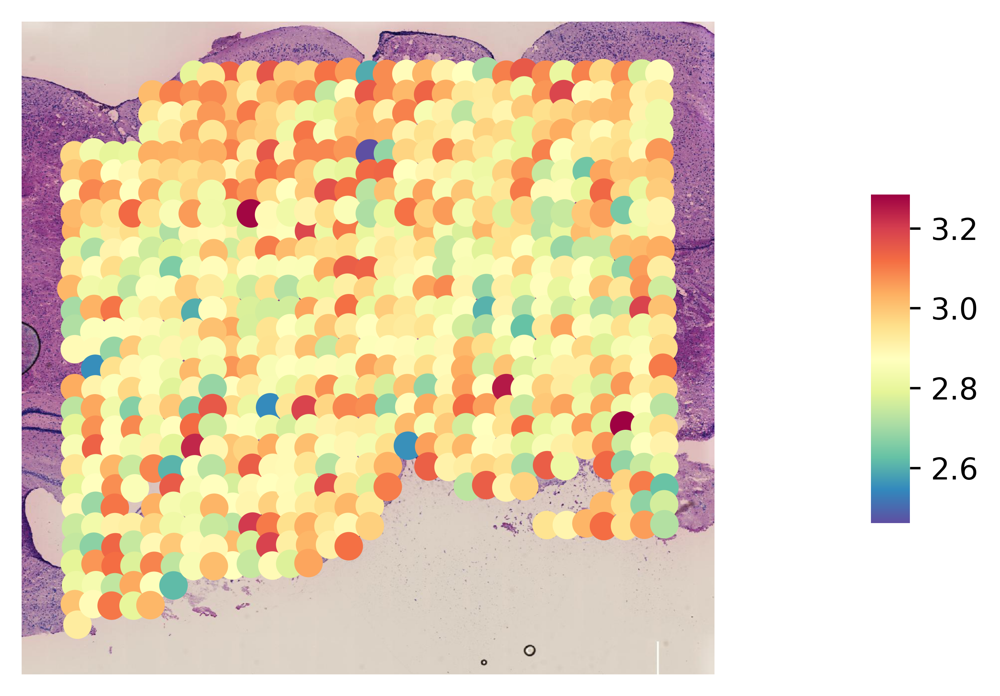

<Figure size 1800x1200 with 0 Axes>

In [29]:
test_dataset_ = test_dataset[:,gene].copy()
test_dataset_.X = test_dataset_.obsm["predicted_gene"]

OUT_PATH = Path(".") / gene
OUT_PATH.mkdir(parents=True, exist_ok=True)

for i, library in enumerate(
    ["Sample5", "Sample6"]
):
    ad = test_dataset[test_dataset.obs.library_id == library, :].copy()
    print('\n'+gene+':')
    gene_plot(ad, genes=gene, spot_size=90, library_id=library, output=str(OUT_PATH), name="scatter_{}_raw_GT.png".format(library))

for i, library in enumerate(
    ["Sample5", "Sample6"]
):
    ad = test_dataset_[test_dataset_.obs.library_id == library, :].copy()
    print('\n'+gene+':')
    gene_plot(ad, genes=gene, spot_size=90, library_id=library, output=str(OUT_PATH), name="scatter_{}_raw_P.png".format(library))


for adata in [
    test_dataset,
    test_dataset_,
]:
#     count_df = adata.to_df()
#     count_df[count_df <=1] = 0
#     count_df[count_df >1] = 1
#     adata.X = count_df
#     adata[:,gene_list]
    # st.pp.filter_genes(adata,min_cells=3)
    # st.pp.normalize_total(adata)
    st.pp.log1p(adata)
#     st.pp.scale(adata)


for i, library in enumerate(
    ["Sample5", "Sample6"]
):
    ad = test_dataset[test_dataset.obs.library_id == library, :].copy()
    print('\n'+gene+':')
    gene_plot(ad, genes=gene, spot_size=90, library_id=library, output=str(OUT_PATH), name="scatter_{}_log_GT.png".format(library))

for i, library in enumerate(
    ["Sample5", "Sample6"]
):
    ad = test_dataset_[test_dataset_.obs.library_id == library, :].copy()
    print('\n'+gene+':')
    gene_plot(ad, genes=gene, spot_size=90, library_id=library, output=str(OUT_PATH), name="scatter_{}_log_P.png".format(library))


# Plot training & validation acc values
plt.figure(figsize=(5, 5))
plt.plot(train_history.history['loss'])
plt.plot(train_history.history['val_loss'])
plt.title('Model training')
plt.ylabel('loss_score')
plt.xlabel('Epoch')
plt.legend(['Train', 'valid'], loc='upper right')
plt.savefig(OUT_PATH / "training_loss.png")

true_y = np.array(test_dataset[:,gene].to_df()).ravel()
pred_y = np.array(test_dataset_[:,gene].to_df()).ravel()
df = pd.DataFrame({"true_y":true_y, "pred_y":pred_y})
r2 = stats.pearsonr(true_y, 
                    pred_y)[0] ** 2
sns.set_theme()
g = sns.lmplot(data=df,
    x="true_y", y="pred_y",
    height=5, legend=True
)
# g.set(ylim=(0, 360), xlim=(0,360))

g.set_axis_labels("true", "pred")
plt.annotate(r'$R^2:{0:.2f}$'.format(r2),
            (max(true_y)*0.8, max(pred_y)*0.8))
plt.savefig(OUT_PATH / "pearsonr.png")
